#  Demo code instruction
This is a demo code that implements the dual equivalent inclusion (DEI) method in a 3D half-space problem. 

Running the code from the top, this code generates the DEI solution of a 3D elastostatic problem shown in the paper. The code outline is shown in the following workflow. The code will require `okada-wrapper` and `plotly` modules, respectively for the Okada-model computation and visualisation. Both are available in pip and conda (like `pip install okada-wrapper` and `conda install plotly` or `pip install plotly`). 
The code will require `numba` module as well for a little accerelation (otherwise, please erase `from numba import jit` and`@jit`).

# Workflow

1. Kernel definition
1. Geometric setting
1. Deformation computation
1. Visualisation

# Kernel definition 

Displacement and (unsymmetrised) strain nuclei of a rectanglar fault (Okada model). Additional functions are further attached for computing fault angles (dip and strike angles) from tangential and normal vectors of the fault, for rotating the source, and for converting strain to traction.

In [2]:
#visualisation of Okada model

from okada_wrapper import dc3d0wrapper, dc3dwrapper
import plotly.graph_objects as go
import numpy as np
N_per_side_half=20
N_per_side=N_per_side_half*2

X, Y, Z = np.mgrid[-1.95:1.95:40j, -1.95:1.95:40j, -1.95:-0.05:20j]
values =    np.sin(np.pi*X) * np.cos(np.pi*Z) * np.sin(np.pi*Y)
#print(Z)

for i in range (0, N_per_side):
    #print(X[i][i][0])
    for j in range (0, N_per_side):
        for k in range (0, N_per_side_half):
            success, u, grad_u = dc3dwrapper(2./3., [X[i][j][k],Y[i][j][k],Z[i][j][k]],
                                         0.5, 90, [-0.5, 0.5], [-0.5, 0.5],
                                         [1.0, 0.0, 0.0,0.0])
            values[i][j][k]=u[0]#ux is visualised
            #values[i][j][k]=grad_u[0][0]#ux,x is visualised


fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=values.flatten(),
    isomin=-0.5,
    isomax=0.5,
    opacity=0.25, # max opacity
    opacityscale=[[-0.5, 1],[0, 0],[0.5,1]],
    surface_count=21,
    colorscale='RdBu_r'
    )
)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgba(30,30,30,0.01)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

In [5]:
#additional modules for Okada model to calculate fault orientations and related coordinate transforms

from numba import jit #not accelerating much in the following computation

#@jit
def angle_calculator(fault_normal,fault_strike):
    #inputs: fault_normal[3], fault_strike[3] 
    #outputs: dip_angle_anticlockwise,strike_angle_clockwise 
    #!! dip and strike angles are both in radians (Okada_model's dip angle is in degrees though)
    
    #def (in a convetional manner) 
    #fault strike : a horizontal vector spanning the fault face 
    #dip angle    : (anticlockwise) angle of the fault about fault-strike axis (origin: fault normal= x3 unit vector)
    #strike angle : (clockwise) angle of the fault about x3 axis (origin: strike axis= x1 unit vector)
    #0<dip angle<pi, -pi<strike angle<pi, 
    dip_angle_anticlockwise_radian=np.arccos(fault_normal[2])
    strike_angle_clockwise_radian=-np.arccos(fault_strike[0])*np.sign(fault_strike[1]+1.0e-6)#+1.0e-6 is for handling the exception: np.sign(0)=0
    return dip_angle_anticlockwise_radian, strike_angle_clockwise_radian


def rotated_Okada_model(alpha,receiver_coordinate,depth,dip,al12,aw12,dislocations,strikeangle_clockwise_radian):
    #inputs: ordinary parameters of Okada model & strikeangle_clockwise_radian (calculated in the above module)
    #outputs: u and grad_u (of Okada model) horizontally rotated by strikeangle_clockwise
    
    #!! dip angle in degree (as in the original implementation of Okada model)
    #!! strike angle in radian
    rotation_matrix=np.array([[np.cos(strikeangle_clockwise_radian),-np.sin(strikeangle_clockwise_radian),0],
                              [np.sin(strikeangle_clockwise_radian),np.cos(strikeangle_clockwise_radian),0],
                              [0,0,1]])
    rotated_receiver_coordinate=np.dot(rotation_matrix,receiver_coordinate)
    #success, rotated_u, rotated_grad_u = dc3dwrapper(alpha,[rotated_receiver_coordinate[0],rotated_receiver_coordinate[1],rotated_receiver_coordinate[2]],
    #                                     depth, dip, [al12[0],al12[1]], [aw12[0],aw12[1]],
    #                                     [dislocations[0],dislocations[1],dislocations[2],dislocations[3]])
    success, rotated_u, rotated_grad_u = dc3dwrapper(alpha,rotated_receiver_coordinate,
                                         depth, dip, al12, aw12,
                                         dislocations)

    u=np.dot(rotation_matrix.T,rotated_u)
    grad_u=np.dot(np.dot(rotation_matrix.T,rotated_grad_u),rotation_matrix)
    #print(rotated_receiver_coordinate+[0,0,depth],depth,dip,rotated_u)#->rotated_receiver_coordinate is perturbed along y direction when dip 90, and z direction with dip 180. 
    return success, u, grad_u 

@jit
def displacementgrad2traction(delu,lamb,mu,normalvect):
    #lamb_times_straintrace=lamb*np.trace(delu)
    #traction=lamb_times_straintrace*normalvect+mu*np.dot(delu+delu.T,normalvect)
    #return traction
    return lamb*np.trace(delu)*normalvect+mu*np.dot(delu+delu.T,normalvect)

In [6]:
#Checks the rotation code

from okada_wrapper import dc3d0wrapper, dc3dwrapper
#visualisation of rotated Okada model
import plotly.graph_objects as go
import numpy as np
N_per_side_half=20
N_per_side=N_per_side_half*2

X, Y, Z = np.mgrid[-1.95:1.95:40j, -1.95:1.95:40j, -1.95:-0.05:20j]
values =    np.sin(np.pi*X) * np.cos(np.pi*Z) * np.sin(np.pi*Y)
#print(Z)

for i in range (0, N_per_side):
    #print(X[i][i][0])
    for j in range (0, N_per_side):
        for k in range (0, N_per_side_half):
            success, u, grad_u = rotated_Okada_model(2./3., [X[i][j][k],Y[i][j][k],Z[i][j][k]],
                                         0.5, 90, [-0.5, 0.5], [-0.5, 0.5],
                                         [1.0, 0.0, 0.0,0.0],np.pi/2)
            values[i][j][k]=u[1]#uy is visualised
            #values[i][j][k]=grad_u[0][0]#ux,x is visualised


fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=values.flatten(),
    isomin=-0.5,
    isomax=0.5,
    opacity=0.25, # max opacity
    opacityscale=[[-0.5, 1],[0, 0],[0.5,1]],
    surface_count=21,
    colorscale='RdBu_r'
    )
)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgba(30,30,30,0.01)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

# Geometric setting

An $x_1,x_2$-axially symmetric rectangular material interface, shown in the paper, is assumed in the demo code. The medium is in the lower half-space ($x_3<0$). 

Numerical parameters are the size of elements (`DX_tot`) and the numbers of elements along sides (`SideLengthperDX` for all the sides for brevity). The product of them gives the length of sides (`SideLength_damagezone`). Parameter sets used in the paper lie just below. 

In [7]:
#Geometrical parameter set for a cubic shape damage zone
DX_tot=0.15
SideLengthperDX=10

Num_elements_tot=5*SideLengthperDX**2 #4 side faces+1 bottom face involve SideLengthperDX**2 elements 
Num_components_tot=Num_elements_tot*3 
#number of elements...SideLengthperDX*SideLengthperDX*6
#number of components...number of elements*3

SideLength_damagezone=SideLengthperDX*DX_tot 

In [8]:
print(SideLength_damagezone)

1.5


In [9]:
import numpy as np
#def strike_updip_normal_vector_calculator_rotated_Okada_model(along_strike_side,along_dip_side,fault_strike,fault_updip,fault_normal):
def strike_updip_normal_vector_calculator_rotated_Okada_model(along_strike_side,along_updip_side):
    #inputs: along_strike_side[3], along_updip_side[3], 
    #       (two-vectors of fault_sides and x3 component of fault normal, respectively)     
    #outputs: fault_strike[3], fault_updip[3], fault_normal[3]
    #        (strike, up-dip, and normal vectors, respectively)
    fault_strike=along_strike_side/np.linalg.norm(along_strike_side)
    fault_updip=along_updip_side/np.linalg.norm(along_updip_side)
    fault_normal=np.cross(fault_strike,fault_updip)    
    return fault_strike, fault_updip, fault_normal
    
def face_discretisation(apex_location_init, apex_location_fin_strike,apex_location_fin_updip,num_of_elements_along_strike,num_of_elements_along_updip,center_location_of_elements,normal_vect_elements,strike_vect_elements,updip_vect_elements):
    #Discretising a rectangle with a structure grid
    #A side of the rectangle is assumed horizontal

    #inputs: apex locations[3](init,fin_strike,fin_updip) and # of elements (per strike/updip sides)
    #in-outputs: center location of elements[# of elements][3], (normal, up-dip strike) vectors[# of elements][3], 
    #outputs: discretisation lengths[2] 
    #         (Strikes, updips are directed to apex_location_fin_strike/updip from apex_location_init)
    #         (Normals are the cross product of the strike and up-dip vectors)
    dx_strike=apex_location_fin_strike-apex_location_init
    dx_strike=dx_strike/num_of_elements_along_strike
    dx_updip=apex_location_fin_updip-apex_location_init
    dx_updip=dx_updip/num_of_elements_along_updip

    strike_vect_face,updip_vect_face,normal_vect_face= strike_updip_normal_vector_calculator_rotated_Okada_model(dx_strike,dx_updip)
    #print(dx_strike,dx_updip,normal_vect_face)
    
    for i in range(num_of_elements_along_strike):
        for j in range(num_of_elements_along_updip):
            center_location_of_elements[i][j]=(0.5+i)*dx_strike+(0.5+j)*dx_updip+apex_location_init
            strike_vect_elements[i][j]=strike_vect_face
            updip_vect_elements[i][j]=updip_vect_face
            normal_vect_elements[i][j]=normal_vect_face
    return [(dx_strike[0]**2+dx_strike[1]**2)**0.5,(dx_updip[0]**2+dx_updip[1]**2)**0.5] #discretisation lengths


In [10]:
#Subdivides material interfaces

#location of apexes x_apex[i][j][k] (2i-1,2j-1,2k-1: the sign of x1,x2,x3 components)
x_apex=np.zeros((2,2,2,3))
for i in range (0, 2):
    for j in range (0, 2):
        for k in range (0, 2):
            x_apex[i][j][k]=[(i-0.5)*SideLength_damagezone,(j-0.5)*SideLength_damagezone,(k-1)*SideLength_damagezone]

#location of elements on sides (left, right, top, bottom, front, back)
loc_elements_x0=np.zeros((SideLengthperDX,SideLengthperDX,3))
loc_elements_x1=np.zeros((SideLengthperDX,SideLengthperDX,3))
loc_elements_y0=np.zeros((SideLengthperDX,SideLengthperDX,3))
loc_elements_y1=np.zeros((SideLengthperDX,SideLengthperDX,3))
loc_elements_z0=np.zeros((SideLengthperDX,SideLengthperDX,3))
#loc_elements_z1=np.zeros((SideLengthperDX,SideLengthperDX,3))

#normal, strike, updip vectors of elements on sides (left, right, top, bottom, front, back)
#normal is set as exterior
normal_elements_x0=np.zeros((SideLengthperDX,SideLengthperDX,3))
normal_elements_x1=np.zeros((SideLengthperDX,SideLengthperDX,3))
normal_elements_y0=np.zeros((SideLengthperDX,SideLengthperDX,3))
normal_elements_y1=np.zeros((SideLengthperDX,SideLengthperDX,3))
normal_elements_z0=np.zeros((SideLengthperDX,SideLengthperDX,3))
#normal_elements_z1=np.zeros((SideLengthperDX,SideLengthperDX,3))

strike_elements_x0=np.zeros((SideLengthperDX,SideLengthperDX,3))
strike_elements_x1=np.zeros((SideLengthperDX,SideLengthperDX,3))
strike_elements_y0=np.zeros((SideLengthperDX,SideLengthperDX,3))
strike_elements_y1=np.zeros((SideLengthperDX,SideLengthperDX,3))
strike_elements_z0=np.zeros((SideLengthperDX,SideLengthperDX,3))
#strike_elements_z1=np.zeros((SideLengthperDX,SideLengthperDX,3))

updip_elements_x0=np.zeros((SideLengthperDX,SideLengthperDX,3))
updip_elements_x1=np.zeros((SideLengthperDX,SideLengthperDX,3))
updip_elements_y0=np.zeros((SideLengthperDX,SideLengthperDX,3))
updip_elements_y1=np.zeros((SideLengthperDX,SideLengthperDX,3))
updip_elements_z0=np.zeros((SideLengthperDX,SideLengthperDX,3))
#updip_elements_z1=np.zeros((SideLengthperDX,SideLengthperDX,3))

#x=-L/2(i=0)
face_discretisation(x_apex[0][1][0], x_apex[0][0][0],x_apex[0][1][1],SideLengthperDX,SideLengthperDX,loc_elements_x0,normal_elements_x0,strike_elements_x0,updip_elements_x0)
#x=L/2(i=1)
face_discretisation(x_apex[1][0][0], x_apex[1][1][0],x_apex[1][0][1],SideLengthperDX,SideLengthperDX,loc_elements_x1,normal_elements_x1,strike_elements_x1,updip_elements_x1)
#y=-L/2(j=0)
face_discretisation(x_apex[0][0][0], x_apex[1][0][0],x_apex[0][0][1],SideLengthperDX,SideLengthperDX,loc_elements_y0,normal_elements_y0,strike_elements_y0,updip_elements_y0)
#y=L/2(j=1)
face_discretisation(x_apex[1][1][0], x_apex[0][1][0],x_apex[1][1][1],SideLengthperDX,SideLengthperDX,loc_elements_y1,normal_elements_y1,strike_elements_y1,updip_elements_y1)
#z=-L(k=0)
face_discretisation(x_apex[1][1][0], x_apex[1][0][0],x_apex[0][1][0],SideLengthperDX,SideLengthperDX,loc_elements_z0,normal_elements_z0,strike_elements_z0,updip_elements_z0)

##z=0(k=1)...outcropping face unnecessary 
#face_discretisation(x_apex[0][0][1], x_apex[1][0][1],x_apex[0][1][1],SideLengthperDX,SideLengthperDX,loc_elements_z1,normal_elements_z1,strike_elements_z1,updip_elements_z1)

#print(x_apex)
#print(loc_elements_z0)
#print(loc_elements_z1,normal_elements_z1,strike_elements_z1,updip_elements_z1)


loc_elements_tot=np.concatenate([loc_elements_x0, loc_elements_x1, loc_elements_y0, loc_elements_y1, loc_elements_z0])
normal_elements_tot_exterior=np.concatenate([normal_elements_x0, normal_elements_x1, normal_elements_y0, normal_elements_y1, normal_elements_z0])
strike_elements_tot=np.concatenate([strike_elements_x0, strike_elements_x1, strike_elements_y0, strike_elements_y1, strike_elements_z0])
updip_elements_tot=np.concatenate([updip_elements_x0, updip_elements_x1, updip_elements_y0, updip_elements_y1, updip_elements_z0])

#print(strike_elements_tot)
#print(loc_elements_tot)
#print(loc_elements_tot.ravel().reshape(SideLengthperDX**2*6,3))

loc_elements_tot=loc_elements_tot.ravel().reshape(Num_elements_tot,3)
normal_elements_tot_exterior=normal_elements_tot_exterior.ravel().reshape(Num_elements_tot,3)
strike_elements_tot=strike_elements_tot.ravel().reshape(Num_elements_tot,3)
updip_elements_tot=updip_elements_tot.ravel().reshape(Num_elements_tot,3)
#print(loc_elements_tot)




In [11]:
print(x_apex)

[[[[-0.75 -0.75 -1.5 ]
   [-0.75 -0.75  0.  ]]

  [[-0.75  0.75 -1.5 ]
   [-0.75  0.75  0.  ]]]


 [[[ 0.75 -0.75 -1.5 ]
   [ 0.75 -0.75  0.  ]]

  [[ 0.75  0.75 -1.5 ]
   [ 0.75  0.75  0.  ]]]]


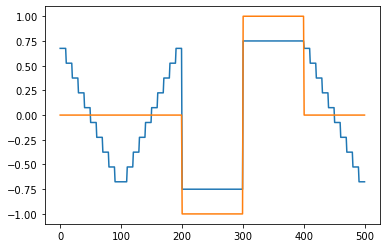

In [12]:
#print(loc_elements_tot) # (x1,x2,x3) values of elements
import matplotlib.pyplot as plt
#f=np.dot(loc_elements_tot,[1,0,0])# x1 values of elements
f=np.dot(loc_elements_tot,[0,1,0])# x2 values of elements
#f=np.dot(loc_elements_tot,[0,0,1])# x3 values of elements
plt.plot(f)
#g=np.dot(normal_elements_tot_exterior,[1,0,0])# x1 values of normal vectors of elements
g=np.dot(normal_elements_tot_exterior,[0,1,0])# x2 values of normal vectors of elements
#g=np.dot(normal_elements_tot_exterior,[0,0,1])# x3 values of normal vectors of elements
plt.plot(g)



# Deformation computation

Associated dual equivalent inclusions are computed in a linear-inverse manner. 
The following example considers deformation due to a rectangular slip (given by the Okada model for the case of the homogeneous medium). 

Numerical parameters are the rigidity in the sub-domain (`LAMBDA_in` and `MU_in` for the inside of the rectangular and `LAMBDA_out` and `MU_out` for horizontal sides, respectively). The parameter sets used in the paper lie just below. 

In [13]:
#Giving material parameters to volumes
#a homogeneous case
#LAMBDA_in=1
#MU_in=1
#LAMBDA_out=1
#MU_out=1
#used by the authors in the demonstration
LAMBDA_in=1./3.
MU_in=1./3.
LAMBDA_out=1.
MU_out=1.
#alpha required in the Okada model: (lambda+mu)/(lambda+2*mu)
ALPHA_in=(LAMBDA_in+MU_in)/(LAMBDA_in+2*MU_in)
ALPHA_out=(LAMBDA_out+MU_out)/(LAMBDA_out+2*MU_out)



In [14]:
#Additional problem descriptions 

#source parameters
original_epicenter_location=np.array([1,0,0])
original_source_depth=0.5 #depth of the fault center
original_fault_length_along_strike=2
original_fault_length_along_dip=1
original_dip_angle_anticlockwise_degree=90 
original_strike_angle_clockwise=0
original_dislocations=np.array([1,0,0,0])

#positive iota for discriminating upper and lower one-sided limits approaching the receiver boundary
EPSILON_UPPER_LOWER_SHIFT=1.0e-6*3 
#NOTICE! 
#epsilon seems required to be larger than 10^-6 
#for the correct computation of the on-source (near-source) displacement in using okada_wrapper 
#(probably the single precision arithmetic is done in the wrapped original fortran code and it requires distant receivers from the source at least by epsilon > 10^-6) 

In [15]:
%%time 
#Calculates kernels for contiunity conditions

ker_u_in =np.zeros([Num_components_tot,Num_components_tot])
ker_u_out=np.zeros([Num_components_tot,Num_components_tot])
ker_T_in =np.zeros([Num_components_tot,Num_components_tot])
ker_T_out=np.zeros([Num_components_tot,Num_components_tot])

buf_relative_receiver_location_from_epicenter=np.zeros(3)
buf_success=0
buf_u=np.zeros(3)
buf_grad_u=np.zeros([3,3])
unit_dislocations_set=np.zeros([3,4])
for k in range (3):
    unit_dislocations_set[k][k]=1
buf_traction=np.zeros(3)

epicenter_location_elements=np.dot(loc_elements_tot,np.array([[1,0,0],[0,1,0],[0,0,0]]))
dip_angle_anticlockwise_elements=np.zeros(Num_elements_tot)
strike_angle_clockwise_elements=np.zeros(Num_elements_tot)
for i in range(Num_elements_tot):
    dip_angle_anticlockwise_elements[i],strike_angle_clockwise_elements[i]=angle_calculator(normal_elements_tot_exterior[i],strike_elements_tot[i])
#buf_dip_angle_anticlockwise=0 
#buf_strike_angle_clockwise=0

for i in range(Num_elements_tot):
    for j in range(Num_elements_tot):
        #buf_dip_angle_anticlockwise, buf_strike_angle_clockwise =angle_calculator(normal_elements_tot_exterior[j],strike_elements_tot[j])
        buf_relative_receiver_location_from_epicenter=loc_elements_tot[i]-epicenter_location_elements[j]-normal_elements_tot_exterior[i]*EPSILON_UPPER_LOWER_SHIFT #lower side of boundary (within the interior volume)
        for k in range(3):
            buf_success, buf_u, buf_grad_u = rotated_Okada_model(ALPHA_in,buf_relative_receiver_location_from_epicenter,-loc_elements_tot[j][2],dip_angle_anticlockwise_elements[j]*180/np.pi,[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[k],strike_angle_clockwise_elements[j])
            buf_traction=displacementgrad2traction(buf_grad_u,LAMBDA_in,MU_in,normal_elements_tot_exterior[i])
            ker_u_in[3*i+0][3*j+k]=buf_u[0]
            ker_u_in[3*i+1][3*j+k]=buf_u[1]
            ker_u_in[3*i+2][3*j+k]=buf_u[2]
            ker_T_in[3*i+0][3*j+k]=buf_traction[0]
            ker_T_in[3*i+1][3*j+k]=buf_traction[1]
            ker_T_in[3*i+2][3*j+k]=buf_traction[2]
            #sign check of the nucleus, whether the lower face moves back by half of the dislocation (valid when distant from the ground surface)
            #if i==j and k==0:
            #    print(i,j,np.dot(buf_u,strike_elements_tot[i]))
            #if i==j and k==1:
            #    print(i,j,np.dot(buf_u,updip_elements_tot[i]))
            #if i==j and k==2:
            #    print(i,j,np.dot(buf_u,normal_elements_tot_exterior[i]))
            
        buf_relative_receiver_location_from_epicenter=loc_elements_tot[i]-epicenter_location_elements[j]+normal_elements_tot_exterior[i]*EPSILON_UPPER_LOWER_SHIFT #upper side of boundary (within the exterior volume)
        for k in range(3):
            buf_success, buf_u, buf_grad_u = rotated_Okada_model(ALPHA_out,buf_relative_receiver_location_from_epicenter,-loc_elements_tot[j][2],dip_angle_anticlockwise_elements[j]*180/np.pi,[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[k],strike_angle_clockwise_elements[j])
            buf_traction=displacementgrad2traction(buf_grad_u,LAMBDA_out,MU_out,normal_elements_tot_exterior[i])
            ker_u_out[3*i+0][3*j+k]=buf_u[0]
            ker_u_out[3*i+1][3*j+k]=buf_u[1]
            ker_u_out[3*i+2][3*j+k]=buf_u[2]
            ker_T_out[3*i+0][3*j+k]=buf_traction[0]
            ker_T_out[3*i+1][3*j+k]=buf_traction[1]
            ker_T_out[3*i+2][3*j+k]=buf_traction[2]
            #sign check of the nucleus, whether the upper face moves forward by half of the dislocation (valid when distant from the ground surface)
            #if i==j and k==0:
            #    print(i,j,np.dot(buf_u,strike_elements_tot[i]))
            #if i==j and k==1:
            #    print(i,j,np.dot(buf_u,updip_elements_tot[i]))
            #if i==j and k==2:
            #    print(i,j,np.dot(buf_u,normal_elements_tot_exterior[i]))    


CPU times: user 55.4 s, sys: 836 ms, total: 56.3 s
Wall time: 1min 3s


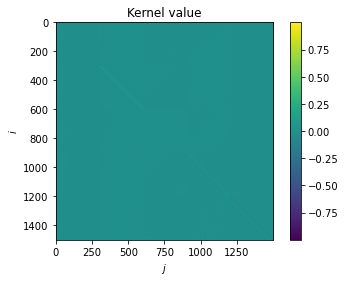

In [16]:
#Vizualising kernels
import matplotlib.pyplot as plt 
plt.imshow(ker_u_out-ker_u_in) #discontinous part of displacement nucleus
#plt.imshow(ker_u_in+ker_u_out) #continous part of displacement nucleus
#plt.imshow(ker_T_out-ker_T_in) #cancelling when LAMBDA_in=LAMBDA_out,MU_in=MU_out within the numerical precision (slight shift is due to EPSILON_UPPER_LOWER_SHIFT)
plt.xlabel('$j$')
plt.ylabel('$i$')
plt.title('Kernel value')
plt.colorbar()
plt.show()


In [17]:
#Calculating a homogeneous solution
#Example: dislocation cutting the material interface

u_homogeneous_in=np.zeros(Num_components_tot)
T_homogeneous_in=np.zeros(Num_components_tot)

u_homogeneous_out=np.zeros(Num_components_tot)
T_homogeneous_out=np.zeros(Num_components_tot)

buf_success=0
buf_u=np.zeros(3)
buf_grad_u=np.zeros([3,3])
buf_traction=np.zeros(3)
buf_relative_receiver_location_from_epicenter=np.zeros(3)

for i in range(Num_elements_tot):
    #reference state for inside 
    #epsilon shift is omitted as the receiver collocation point is not on the original source face
    buf_relative_receiver_location_from_epicenter=loc_elements_tot[i]-original_epicenter_location-normal_elements_tot_exterior[i]*EPSILON_UPPER_LOWER_SHIFT*0 #lower side of boundary (within the interior volume)
    buf_success, buf_u, buf_grad_u = rotated_Okada_model(ALPHA_in,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
    buf_traction=displacementgrad2traction(buf_grad_u,LAMBDA_in,MU_in,normal_elements_tot_exterior[i])
    u_homogeneous_in[3*i+0]=buf_u[0]
    u_homogeneous_in[3*i+1]=buf_u[1]
    u_homogeneous_in[3*i+2]=buf_u[2]
    T_homogeneous_in[3*i+0]=buf_traction[0]
    T_homogeneous_in[3*i+1]=buf_traction[1]
    T_homogeneous_in[3*i+2]=buf_traction[2]

    #reference state for outside
    #epsilon shift is omitted as the receiver collocation point is not on the original source face
    buf_relative_receiver_location_from_epicenter=loc_elements_tot[i]-original_epicenter_location+normal_elements_tot_exterior[i]*EPSILON_UPPER_LOWER_SHIFT*0 #upper side of boundary (within the exterior volume)
    buf_success, buf_u, buf_grad_u = rotated_Okada_model(ALPHA_out,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
    buf_traction=displacementgrad2traction(buf_grad_u,LAMBDA_out,MU_out,normal_elements_tot_exterior[i])
    u_homogeneous_out[3*i+0]=buf_u[0]
    u_homogeneous_out[3*i+1]=buf_u[1]
    u_homogeneous_out[3*i+2]=buf_u[2]
    T_homogeneous_out[3*i+0]=buf_traction[0]
    T_homogeneous_out[3*i+1]=buf_traction[1]
    T_homogeneous_out[3*i+2]=buf_traction[2]

#print(u_homogeneous_in-u_homogeneous_out)
#print(T_homogeneous_in-T_homogeneous_out)

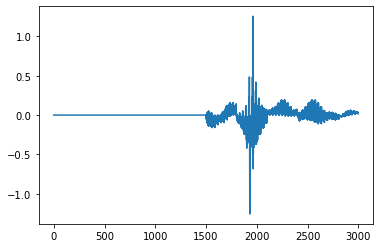

In [18]:
#Solving linear-inverse problems
uT_homogeneous=np.concatenate([u_homogeneous_in-u_homogeneous_out,T_homogeneous_in-T_homogeneous_out])
#print(uT_homogeneous.shape)
#print(uT_homogeneous)
a=np.block([[-ker_u_in,ker_u_out],[-ker_T_in,ker_T_out]])
ustar_in_out=np.linalg.solve(a,uT_homogeneous)
#print(ustar_in_out)
ustar_in=ustar_in_out[0:Num_components_tot]
ustar_out=ustar_in_out[Num_components_tot:2*Num_components_tot]
#print(ustar_in)
#print(ustar_out)
plt.plot(uT_homogeneous)
#plt.plot(ustar_in_out)
#plt.plot(ustar_in)
#plt.plot(ustar_out)
plt.show()

# Visualisation
3D visualisation by `plotly` seemed viewer-dependent, and it worked with jupyter-notebook on Chrome browsers, but was erroneous with Safari and JupyterLab, for the case of Author's laptop (Dec. 2020).

In [19]:
%%time
#Computing the internal deformation field of the obtained DEI solution 
visualised_range_maxXYZ=2
#N_per_side_half=10#rougher visualisation grid
N_per_side_half=15#finer visualisation grid

N_per_side=N_per_side_half*2
edge_on_1D_axis=visualised_range_maxXYZ-visualised_range_maxXYZ/N_per_side
x1_grid=np.linspace(-edge_on_1D_axis,edge_on_1D_axis,N_per_side) 
x2_grid=np.linspace(-edge_on_1D_axis,edge_on_1D_axis,N_per_side)
x3_grid=np.linspace(-edge_on_1D_axis,edge_on_1D_axis-visualised_range_maxXYZ,N_per_side_half)


Y,X,Z= np.meshgrid(x1_grid,x2_grid,x3_grid) #X[i][j][k]=X[i][0][0],Y[i][j][k]=Y[0][j][0],Z[i][j][k]=Z[0][0][k]
#print(X[6][5][2]-X[6][0][0])
#print(Y[6][5][2]-Y[0][5][0])
#print(Z[6][5][2]-Z[0][0][2])
#X, Y, Z = np.mgrid[-1.95:1.95:40j, -1.95:1.95:40j, -1.95:-0.05:20j]
grid_location=np.stack([X, Y, Z],3)
u_field_homogeneous =  np.stack([np.sin(np.pi*X), np.cos(np.pi*Z), np.sin(np.pi*Y)],3)
u_field_homogeneous_in = np.zeros_like(u_field_homogeneous)
u_field_homogeneous_out = np.zeros_like(u_field_homogeneous)
u_field_shift_in =  np.zeros_like(u_field_homogeneous)
u_field_shift_out =  np.zeros_like(u_field_homogeneous)
grad_u_field_homogeneous =  np.stack([np.zeros_like(u_field_homogeneous), np.zeros_like(u_field_homogeneous), np.zeros_like(u_field_homogeneous)],3)
grad_u_field_shift=np.zeros_like(grad_u_field_homogeneous)
#print(Z)

buf_relative_receiver_location_from_epicenter=np.zeros(3)
buf_relative_receiver_location_from_epicenter_rotated=np.zeros(3)
buf_success=0
buf_u=np.zeros([3,3])
buf_grad_u=np.zeros([3,3,3])
unit_dislocations_set=np.zeros([3,4])
for m in range (3):
    unit_dislocations_set[m][m]=1
epicenter_location_elements=np.dot(loc_elements_tot,np.array([[1,0,0],[0,1,0],[0,0,0]]))
dip_angle_anticlockwise_elements_degree=np.zeros(Num_elements_tot)
strike_angle_clockwise_elements=np.zeros(Num_elements_tot)
rotation_matrix_elements=np.zeros((Num_elements_tot,3,3))
rotation_matrix_elements_transpose=np.zeros((Num_elements_tot,3,3))
for i in range(Num_elements_tot):
    dip_angle_anticlockwise_elements_degree[i],strike_angle_clockwise_elements[i]=angle_calculator(normal_elements_tot_exterior[i],strike_elements_tot[i])
    dip_angle_anticlockwise_elements_degree[i]=dip_angle_anticlockwise_elements_degree[i]*180./np.pi
    rotation_matrix_elements[i]=np.array([[np.cos(strike_angle_clockwise_elements[i]),-np.sin(strike_angle_clockwise_elements[i]),0],
                              [np.sin(strike_angle_clockwise_elements[i]),np.cos(strike_angle_clockwise_elements[i]),0],
                              [0,0,1]])
    rotation_matrix_elements_transpose[i]=rotation_matrix_elements[i].T 

for i in range (0, N_per_side):
    for j in range (0, N_per_side):
        for k in range (0, N_per_side_half):
            if (abs(x1_grid[i])< 0.5*SideLength_damagezone) and (abs(x2_grid[j])<0.5*SideLength_damagezone) and (abs(x3_grid[k]+0.5*SideLength_damagezone)<0.5*SideLength_damagezone):
                buf_relative_receiver_location_from_epicenter=grid_location[i][j][k]-original_epicenter_location
                #buf_success, u_field_homogeneous_in[i][j][k], buf_grad_u = rotated_Okada_model(ALPHA_in,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
                buf_success, u_field_homogeneous_in[i][j][k], grad_u_field_homogeneous[i][j][k] = rotated_Okada_model(ALPHA_in,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
                for l in range (0, Num_elements_tot):
                    #buf_dip_angle_anticlockwise, buf_strike_angle_clockwise =angle_calculator(normal_elements_tot_exterior[l],strike_elements_tot[l])
                    #buf_relative_receiver_location_from_epicenter=grid_location[i][j][k]-epicenter_location_elements[l]
                    buf_relative_receiver_location_from_epicenter_rotated=np.dot(rotation_matrix_elements[l],grid_location[i][j][k]-epicenter_location_elements[l])
                    for m in range(3):
                        #buf_success, buf_u, buf_grad_u = rotated_Okada_model(ALPHA_in,buf_relative_receiver_location_from_epicenter,-loc_elements_tot[l][2],dip_angle_anticlockwise_elements[l]*180/np.pi,[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[m],strike_angle_clockwise_elements[l])
                        #the following was near twice faster than using rotated_Okada_model in our cases (We took the speed instead of the readability as this 3D visualisation was slow).
                        buf_success, buf_u, buf_grad_u = dc3dwrapper(ALPHA_in,buf_relative_receiver_location_from_epicenter_rotated,-loc_elements_tot[l][2],dip_angle_anticlockwise_elements_degree[l],[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[m])
                        u_field_shift_in[i][j][k]=u_field_shift_in[i][j][k]+np.dot(rotation_matrix_elements_transpose[l],buf_u)*ustar_in[3*l+m]
                        grad_u_field_shift[i][j][k]=grad_u_field_shift[i][j][k]+np.dot(rotation_matrix_elements_transpose[l],np.dot(buf_grad_u,rotation_matrix_elements[l]))*ustar_in[3*l+m] 
            else:
                buf_relative_receiver_location_from_epicenter=grid_location[i][j][k]-original_epicenter_location
                buf_success, u_field_homogeneous_out[i][j][k], grad_u_field_homogeneous[i][j][k] = rotated_Okada_model(ALPHA_out,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
                #buf_success, u_field_homogeneous_out[i][j][k], buf_grad_u = rotated_Okada_model(ALPHA_out,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
                for l in range (0, Num_elements_tot):
                    #buf_dip_angle_anticlockwise, buf_strike_angle_clockwise =angle_calculator(normal_elements_tot_exterior[l],strike_elements_tot[l])
                    #buf_relative_receiver_location_from_epicenter=grid_location[i][j][k]-epicenter_location_elements[l]
                    buf_relative_receiver_location_from_epicenter_rotated=np.dot(rotation_matrix_elements[l],grid_location[i][j][k]-epicenter_location_elements[l])
                    for m in range(3):
                        #buf_success, buf_u, buf_grad_u = rotated_Okada_model(ALPHA_out,buf_relative_receiver_location_from_epicenter,-loc_elements_tot[l][2],dip_angle_anticlockwise_elements[l]*180/np.pi,[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[m],strike_angle_clockwise_elements[l])
                        #the following was near twice faster than using rotated_Okada_model in our cases (We took the speed instead of the readability as this 3D visualisation was slow).
                        buf_success, buf_u, buf_grad_u = dc3dwrapper(ALPHA_out,buf_relative_receiver_location_from_epicenter_rotated,-loc_elements_tot[l][2],dip_angle_anticlockwise_elements_degree[l],[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[m])
                        u_field_shift_out[i][j][k]=u_field_shift_out[i][j][k]+np.dot(rotation_matrix_elements_transpose[l],buf_u)*ustar_out[3*l+m]                                             
                        grad_u_field_shift[i][j][k]=grad_u_field_shift[i][j][k]+np.dot(rotation_matrix_elements_transpose[l],np.dot(buf_grad_u,rotation_matrix_elements[l]))*ustar_out[3*l+m]  
                        
                        
u_field_homogeneous=u_field_homogeneous_in+u_field_homogeneous_out
u_field_shift=u_field_shift_in+u_field_shift_out
u_field=u_field_homogeneous+u_field_shift

grad_u_field=grad_u_field_homogeneous+grad_u_field_shift

CPU times: user 7min 24s, sys: 4.21 s, total: 7min 28s
Wall time: 8min 21s


In [36]:
#visualising and saving the image of the computed DEI solution (internal displacement)

#unit_vectors_for_projection
unit_vector_x1=np.array([1,0,0])
unit_vector_x2=np.array([0,1,0])
unit_vector_x3=np.array([0,0,1])

#deformation in the computed medium
values=np.dot(u_field,unit_vector_x1) 
#values=np.dot(u_field,unit_vector_x2)
#values=np.dot(u_field,unit_vector_x3)

#deformation in the reference homogeneous solution
#values=np.dot(u_field_homogeneous,unit_vector_x1) 
#values=np.dot(u_field_homogeneous,unit_vector_x2)
#values=np.dot(u_field_homogeneous,unit_vector_x3)

#deformation change due to inhomogeneity
#values=np.dot(u_field_shift,unit_vector_x1) 
#values=np.dot(u_field_shift,unit_vector_x2)
#values=np.dot(u_field_shift,unit_vector_x3)

fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=values.flatten(),
    isomin=-0.5, # min of the color scale .. adopted for ux
    isomax=0.5,  # max of the color scale ..             ux
    #isomin=-0.2, # min of the color scale .. adopted for uy
    #isomax=0.2,  # max of the color scale ..             uy
    #isomin=-0.06, # min of the color scale .. adopted for uz
    #isomax=0.06,  # max of the color scale ..             uz
    opacity=0.25, # max opacity
    opacityscale=[[-0.5, 1],[0, 0],[0.5,1]],
    surface_count=21, #adopted for (ux, uy) (inhomogeneous, homogeneous)
    #surface_count=34, #adopted for ux shift
    #surface_count=20, #adopted for uy shift, & for uz (inhomogeneous, homogeneous, shift)
    #surface_count=14,
    colorscale='RdBu_r'
    )
)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgba(30,30,30,0.01)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )
#fig.show()

import plotly 
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=-1.5, y=-0.5, z=2.)
    #eye=dict(x=-2., y=-0.65, z=1.2)
)

fig.update_layout(scene_camera=camera)
fig.show()
#plotly.io.write_image(fig, 'demo3D_ux_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_uy_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_uz_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
                      
#plotly.io.write_image(fig, 'demo3D_ux_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_uy_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_uz_homogeneous.svg', format=None, scale=None, width=None, height=None)
                      
#plotly.io.write_image(fig, 'demo3D_ux_shift.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_uy_shift.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_uz_shift.svg', format=None, scale=None, width=None, height=None)

In [21]:
#visualising the image of the computed DEI solution (internal strain)

#unit_vectors_for_projection
unit_vector_x1=np.array([1,0,0])
unit_vector_x2=np.array([0,1,0])
unit_vector_x3=np.array([0,0,1])

#deformation in the computed medium
values=0.5*(np.dot(np.dot(grad_u_field,unit_vector_x1),unit_vector_x2)+np.dot(np.dot(grad_u_field,unit_vector_x2),unit_vector_x1))

#deformation in the reference homogeneous solution
#values=np.dot(np.dot(grad_u_field_homogeneous,unit_vector_x3),unit_vector_x1)

#deformation change due to inhomogeneity
#values=np.dot(np.dot(grad_u_field_shift,unit_vector_x3),unit_vector_x1)

fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=values.flatten(),
    isomin=-0.3, # min of the color scale
    isomax=0.3,  # max of the color scale
    #isomin=-0.5, # min of the color scale
    #isomax=0.5,  # max of the color scale
    opacity=0.25, # max opacity
    opacityscale=[[-0.5, 1],[0, 0],[0.5,1]],
    surface_count=21,
    colorscale='RdBu_r'
    )
)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgba(30,30,30,0.01)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),
                    zaxis = dict(
                        backgroundcolor="rgba(30,30,30,0.01)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )
#fig.show()

In [22]:
%%time
#Computing the surface deformation field of the obtained DEI solution 

visualised_range_maxXYZ=2
#N_per_side_half_surface=11#rougher visualisation grid
N_per_side_half_surface=13#finer visualisation grid

N_per_side_surface=N_per_side_half_surface*2
edge_on_1D_axis=visualised_range_maxXYZ-visualised_range_maxXYZ/N_per_side_surface
x1_surface_grid=np.linspace(-edge_on_1D_axis,edge_on_1D_axis,N_per_side_surface) 
x2_surface_grid=np.linspace(-edge_on_1D_axis,edge_on_1D_axis,N_per_side_surface)

Y_surface,X_surface= np.meshgrid(x1_surface_grid,x2_surface_grid) #X[i][j][k]=X[i][0][0],Y[i][j][k]=Y[0][j][0]
grid_location_surface=np.stack([X_surface, Y_surface],2)
grid_location_surface_3Drep=np.concatenate([grid_location_surface, np.zeros((N_per_side_surface,N_per_side_surface,1))], axis=2)
u_surface_field_homogeneous =  np.zeros_like(grid_location_surface_3Drep)
u_surface_field_homogeneous_in = np.zeros_like(u_surface_field_homogeneous)
u_surface_field_homogeneous_out = np.zeros_like(u_surface_field_homogeneous)
u_surface_field_shift_in =  np.zeros_like(u_surface_field_homogeneous)
u_surface_field_shift_out =  np.zeros_like(u_surface_field_homogeneous)
grad_u_surface_field_homogeneous =  np.stack([np.zeros_like(u_surface_field_homogeneous), np.zeros_like(u_surface_field_homogeneous), np.zeros_like(u_surface_field_homogeneous)],3)
grad_u_surface_field_shift_in=np.zeros_like(grad_u_surface_field_homogeneous)
grad_u_surface_field_shift_out=np.zeros_like(grad_u_surface_field_homogeneous)

Depth_measuring_surfacedeformation=.0e-6 #Surface deformation is evaluated at depth: Depth_measuring_surfacedeformation 
#print(Z_surface)

buf_relative_receiver_location_from_epicenter=np.zeros(3)
buf_relative_receiver_location_from_epicenter_rotated=np.zeros(3)
buf_success=0
buf_u=np.zeros([3,3])
buf_grad_u=np.zeros([3,3,3])
unit_dislocations_set=np.zeros([3,4])
for m in range (3):
    unit_dislocations_set[m][m]=1
epicenter_location_elements=np.dot(loc_elements_tot,np.array([[1,0,0],[0,1,0],[0,0,0]]))
dip_angle_anticlockwise_elements_degree=np.zeros(Num_elements_tot)
strike_angle_clockwise_elements=np.zeros(Num_elements_tot)
rotation_matrix_elements=np.zeros((Num_elements_tot,3,3))
rotation_matrix_elements_transpose=np.zeros((Num_elements_tot,3,3))
for i in range(Num_elements_tot):
    dip_angle_anticlockwise_elements_degree[i],strike_angle_clockwise_elements[i]=angle_calculator(normal_elements_tot_exterior[i],strike_elements_tot[i])
    dip_angle_anticlockwise_elements_degree[i]=dip_angle_anticlockwise_elements_degree[i]*180./np.pi
    rotation_matrix_elements[i]=np.array([[np.cos(strike_angle_clockwise_elements[i]),-np.sin(strike_angle_clockwise_elements[i]),0],
                              [np.sin(strike_angle_clockwise_elements[i]),np.cos(strike_angle_clockwise_elements[i]),0],
                              [0,0,1]])
    rotation_matrix_elements_transpose[i]=rotation_matrix_elements[i].T 

for i in range (0, N_per_side_surface):
    for j in range (0, N_per_side_surface):
        if (abs(x1_surface_grid[i])< 0.5*SideLength_damagezone) and (abs(x2_surface_grid[j])<0.5*SideLength_damagezone):
            buf_relative_receiver_location_from_epicenter=grid_location_surface_3Drep[i][j]-[0,0,Depth_measuring_surfacedeformation]-original_epicenter_location
            buf_success, u_surface_field_homogeneous_in[i][j], grad_u_surface_field_homogeneous[i][j] = rotated_Okada_model(ALPHA_in,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
            for l in range (0, Num_elements_tot):
                buf_relative_receiver_location_from_epicenter_rotated=np.dot(rotation_matrix_elements[l],grid_location_surface_3Drep[i][j]-[0,0,Depth_measuring_surfacedeformation]-epicenter_location_elements[l])
                for m in range(3):
                    buf_success, buf_u, buf_grad_u = dc3dwrapper(ALPHA_in,buf_relative_receiver_location_from_epicenter_rotated,-loc_elements_tot[l][2],dip_angle_anticlockwise_elements_degree[l],[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[m])
                    u_surface_field_shift_in[i][j]=u_surface_field_shift_in[i][j]+np.dot(rotation_matrix_elements_transpose[l],buf_u)*ustar_in[3*l+m]         
                    grad_u_surface_field_shift_in[i][j]=grad_u_surface_field_shift_in[i][j]+np.dot(rotation_matrix_elements_transpose[l],np.dot(buf_grad_u,rotation_matrix_elements[l]))*ustar_in[3*l+m] 
                        
        else:
            buf_relative_receiver_location_from_epicenter=grid_location_surface_3Drep[i][j]-[0,0,Depth_measuring_surfacedeformation]-original_epicenter_location
            buf_success, u_surface_field_homogeneous_out[i][j], grad_u_surface_field_homogeneous[i][j] = rotated_Okada_model(ALPHA_out,buf_relative_receiver_location_from_epicenter,original_source_depth,original_dip_angle_anticlockwise_degree,[-0.5*original_fault_length_along_strike,0.5*original_fault_length_along_strike],[-0.5*original_fault_length_along_dip,0.5*original_fault_length_along_dip],original_dislocations,original_strike_angle_clockwise)
            for l in range (0, Num_elements_tot):
                buf_relative_receiver_location_from_epicenter_rotated=np.dot(rotation_matrix_elements[l],grid_location_surface_3Drep[i][j]-[0,0,Depth_measuring_surfacedeformation]-epicenter_location_elements[l])
                for m in range(3):
                    buf_success, buf_u, buf_grad_u = dc3dwrapper(ALPHA_out,buf_relative_receiver_location_from_epicenter_rotated,-loc_elements_tot[l][2],dip_angle_anticlockwise_elements_degree[l],[-0.5*DX_tot,0.5*DX_tot],[-0.5*DX_tot,0.5*DX_tot],unit_dislocations_set[m])
                    u_surface_field_shift_out[i][j]=u_surface_field_shift_out[i][j]+np.dot(rotation_matrix_elements_transpose[l],buf_u)*ustar_out[3*l+m]            
                    grad_u_surface_field_shift_out[i][j]=grad_u_surface_field_shift_out[i][j]+np.dot(rotation_matrix_elements_transpose[l],np.dot(buf_grad_u,rotation_matrix_elements[l]))*ustar_out[3*l+m] 

u_surface_field_homogeneous=u_surface_field_homogeneous_in+u_surface_field_homogeneous_out
u_surface_field_shift=u_surface_field_shift_in+u_surface_field_shift_out
u_surface_field=u_surface_field_homogeneous+u_surface_field_shift

grad_u_surface_field_shift=grad_u_surface_field_shift_in+grad_u_surface_field_shift_out
grad_u_surface_field=grad_u_surface_field_homogeneous+grad_u_surface_field_shift
grad_u_surface_field_in=grad_u_surface_field_homogeneous+grad_u_surface_field_shift_in
grad_u_surface_field_out=grad_u_surface_field_homogeneous+grad_u_surface_field_shift_out


CPU times: user 23.9 s, sys: 286 ms, total: 24.2 s
Wall time: 28.4 s


In [23]:
stress_surface_field_homogeneous=np.zeros_like(grad_u_surface_field_homogeneous)
stress_surface_field_shift=np.zeros_like(grad_u_surface_field_homogeneous)
stress_surface_field_homogeneous_normalised=np.zeros_like(grad_u_surface_field_homogeneous)
stress_surface_field_shift_normalised=np.zeros_like(grad_u_surface_field_homogeneous)

#Calculates stress and that normalised by rigidity assuming invarinat Poisson rate
for i in range (0, N_per_side_surface):
    for j in range (0, N_per_side_surface):
        stress_surface_field_homogeneous_normalised[i][j]=LAMBDA_out/MU_out*np.trace(grad_u_surface_field_homogeneous[i][j])*np.identity(3)+(grad_u_surface_field_homogeneous[i][j]+grad_u_surface_field_homogeneous[i][j].T)
        stress_surface_field_shift_normalised[i][j]=LAMBDA_out/MU_out*np.trace(grad_u_surface_field_shift[i][j])*np.identity(3)+(grad_u_surface_field_shift[i][j]+grad_u_surface_field_shift[i][j].T)
        if (abs(x1_surface_grid[i])< 0.5*SideLength_damagezone) and (abs(x2_surface_grid[j])<0.5*SideLength_damagezone):
            stress_surface_field_homogeneous[i][j]= MU_in*stress_surface_field_homogeneous_normalised[i][j]
            stress_surface_field_shift[i][j]= MU_in*stress_surface_field_shift_normalised[i][j]
        else: 
            stress_surface_field_homogeneous[i][j]= MU_out*stress_surface_field_homogeneous_normalised[i][j]
            stress_surface_field_shift[i][j]= MU_out*stress_surface_field_shift_normalised[i][j]

stress_surface_field=stress_surface_field_homogeneous+stress_surface_field_shift
stress_surface_field_normalised=stress_surface_field_homogeneous_normalised+stress_surface_field_shift_normalised

In [48]:
#visualising the image of the computed DEI solution (surface displacement and along-surface strain)
import plotly.graph_objects as go
import plotly.express as px

#unit_vectors_for_projection
unit_vector_x1=np.array([1,0,0])
unit_vector_x2=np.array([0,1,0])
unit_vector_x3=np.array([0,0,1])

#Surface deformation on the computed medium
#---Displacement components
#values_face=np.dot(u_surface_field,unit_vector_x1) #x
#values_face=np.dot(u_surface_field,unit_vector_x2) #y
#values_face=np.dot(u_surface_field,unit_vector_x3) #z
#---Along-surface strain components (normalised stress)
#values_face=np.dot(np.dot(stress_surface_field_normalised,unit_vector_x1),unit_vector_x2) #xy
#values_face=np.dot(np.dot(stress_surface_field_normalised,unit_vector_x1),unit_vector_x1) #xx
#values_face=np.dot(np.dot(stress_surface_field_normalised,unit_vector_x2),unit_vector_x2) #yy
#---Along-surface stress components
#values_face=np.dot(np.dot(stress_surface_field,unit_vector_x1),unit_vector_x2)
#values_face=np.dot(np.dot(stress_surface_field,unit_vector_x1),unit_vector_x1)
#values_face=np.dot(np.dot(stress_surface_field,unit_vector_x2),unit_vector_x2)

#---surfafce traction (bug check whether it becomes 0 or not)
#values_face=np.dot(np.dot(stress_surface_field,unit_vector_x1),unit_vector_x3)
#values_face=np.dot(np.dot(stress_surface_field,unit_vector_x2),unit_vector_x3)
#values_face=np.dot(np.dot(stress_surface_field,unit_vector_x3),unit_vector_x3)


#values_face=0.5*(np.dot(np.dot(grad_u_surface_field,unit_vector_x2),unit_vector_x1)+np.dot(np.dot(grad_u_surface_field,unit_vector_x1),unit_vector_x2))
#values_face=0.5*(3*np.dot(np.dot(grad_u_surface_field,unit_vector_x1),unit_vector_x1)+np.dot(np.dot(grad_u_surface_field,unit_vector_x2),unit_vector_x2)+np.dot(np.dot(grad_u_surface_field,unit_vector_x3),unit_vector_x3))
#values_face=0.5*(np.dot(np.dot(grad_u_surface_field,unit_vector_x1),unit_vector_x1)+3*np.dot(np.dot(grad_u_surface_field,unit_vector_x2),unit_vector_x2)+np.dot(np.dot(grad_u_surface_field,unit_vector_x3),unit_vector_x3))
#values_face=np.dot(np.dot(grad_u_surface_field,unit_vector_x3),unit_vector_x1)

#Surface deformation on the reference homogeneous solution
#---Displacement components
#values_face=np.dot(u_surface_field_homogeneous,unit_vector_x1)
#values_face=np.dot(u_surface_field_homogeneous,unit_vector_x2)
#values_face=np.dot(u_surface_field_homogeneous,unit_vector_x3)
#---Along-surface strain components (normalised stress)
#values_face=np.dot(np.dot(stress_surface_field_homogeneous_normalised,unit_vector_x1),unit_vector_x2)
#values_face=np.dot(np.dot(stress_surface_field_homogeneous_normalised,unit_vector_x1),unit_vector_x1)
#values_face=np.dot(np.dot(stress_surface_field_homogeneous_normalised,unit_vector_x2),unit_vector_x2)
#---Along-surface stress components
#values_face=np.dot(np.dot(stress_surface_field_homogeneous,unit_vector_x1),unit_vector_x2)
#values_face=np.dot(np.dot(stress_surface_field_homogeneous,unit_vector_x1),unit_vector_x1)
#values_face=np.dot(np.dot(stress_surface_field_homogeneous,unit_vector_x2),unit_vector_x2)

#Surface deformation cahnge due to inhomogeneity
#---Displacement components
#values_face=np.dot(u_surface_field_shift,unit_vector_x1)
#values_face=np.dot(u_surface_field_shift,unit_vector_x2)
#values_face=np.dot(u_surface_field_shift,unit_vector_x3)
#---Along-surface strain components (normalised stress)
#values_face=np.dot(np.dot(stress_surface_field_shift_normalised,unit_vector_x1),unit_vector_x2)
#values_face=np.dot(np.dot(stress_surface_field_shift_normalised,unit_vector_x1),unit_vector_x1)
#values_face=np.dot(np.dot(stress_surface_field_shift_normalised,unit_vector_x2),unit_vector_x2)
#---Along-surface stress components
values_face=np.dot(np.dot(stress_surface_field_shift,unit_vector_x1),unit_vector_x2)
#values_face=np.dot(np.dot(stress_surface_field_shift,unit_vector_x1),unit_vector_x1)
#values_face=np.dot(np.dot(stress_surface_field_shift,unit_vector_x2),unit_vector_x2)


fig = go.Figure(data =
     go.Contour(
        x=X_surface.flatten(),
        y=Y_surface.flatten(),
        z=values_face.flatten(),
        colorscale='balance',
        ncontours=51,
    ))
# Adds a rectangle
fig.update_layout(shapes=[
    dict(type="rect", x0=-0.5*SideLength_damagezone, x1=0.5*SideLength_damagezone, y0=-0.5*SideLength_damagezone, y1=0.5*SideLength_damagezone, line_color="white"),
],
    width=450, height=450,xaxis_title="x",yaxis_title="y",xaxis=dict(dtick=0.5),yaxis=dict(dtick=0.5))
#fig.data[0].update(zmin=-1.2501,zmax=1.2501) #normalisedstress_xy
fig.data[0].update(zmin=-1.0001,zmax=1.0001) #stress_xy
#fig.data[0].update(zmin=-2.5001,zmax=2.5001) #normalisedstress_xx,stress_xx,
#fig.data[0].update(zmin=-0.7501,zmax=0.7501) #normalisedstress_yy,stress_yy

#fig.add_shape(type="line",
#    x0=2, y0=2, x1=4, y1=4,
#    line=dict(
#        color="dimgray",
#        width=2,
#        dash="dot",
#    )
#)
#fig.update_layout(xaxis=dict(range=[-5,5]),yaxis=dict(range=[-5,0]))
#fig.show()

fig.show()


#---strain_xy (normalisedstress)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxy_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxy_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxy_shift.svg', format=None, scale=None, width=None, height=None)

#---stress_xy
#plotly.io.write_image(fig, 'demo3D_surface_stressxy_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressxy_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressxy_shift.svg', format=None, scale=None, width=None, height=None)


#---strain (normalisedstress)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxy_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxx_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressyy_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
                      
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxy_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxx_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressyy_homogeneous.svg', format=None, scale=None, width=None, height=None)
                      
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxy_shift.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressxx_shift.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_normalisedstressyy_shift.svg', format=None, scale=None, width=None, height=None)


#---stress
#plotly.io.write_image(fig, 'demo3D_surface_stressxy_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressxx_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressyy_inhomogeneous.svg', format=None, scale=None, width=None, height=None)
                      
#plotly.io.write_image(fig, 'demo3D_surface_stressxy_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressxx_homogeneous.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressyy_homogeneous.svg', format=None, scale=None, width=None, height=None)
                      
plotly.io.write_image(fig, 'demo3D_surface_stressxy_shift.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressxx_shift.svg', format=None, scale=None, width=None, height=None)
#plotly.io.write_image(fig, 'demo3D_surface_stressyy_shift.svg', format=None, scale=None, width=None, height=None)

